# Importing libraries

In [ ]:
import pandas as pd # data preprocessing
import itertools # confusion matrix
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
# To show all the rows of pandas dataframe
pd.set_option('display.max_rows', None)

print('Done')

Done


In [ ]:
drug_train=pd.read_csv('drugsComTrain_raw.tsv', sep='\t')
drug_test=pd.read_csv('drugsComTest_raw.tsv', sep='\t')

In [ ]:
drug_train.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37


In [ ]:
drug_test.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,163740,Mirtazapine,Depression,"""I&#039;ve tried a few antidepressants over th...",10.0,"February 28, 2012",22
1,206473,Mesalamine,"Crohn's Disease, Maintenance","""My son has Crohn&#039;s disease and has done ...",8.0,"May 17, 2009",17
2,159672,Bactrim,Urinary Tract Infection,"""Quick reduction of symptoms""",9.0,"September 29, 2017",3
3,39293,Contrave,Weight Loss,"""Contrave combines drugs that were used for al...",9.0,"March 5, 2017",35
4,97768,Cyclafem 1 / 35,Birth Control,"""I have been on this birth control for one cyc...",9.0,"October 22, 2015",4


# EDA

In [ ]:
drug_train.condition.value_counts()

Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                                     2321

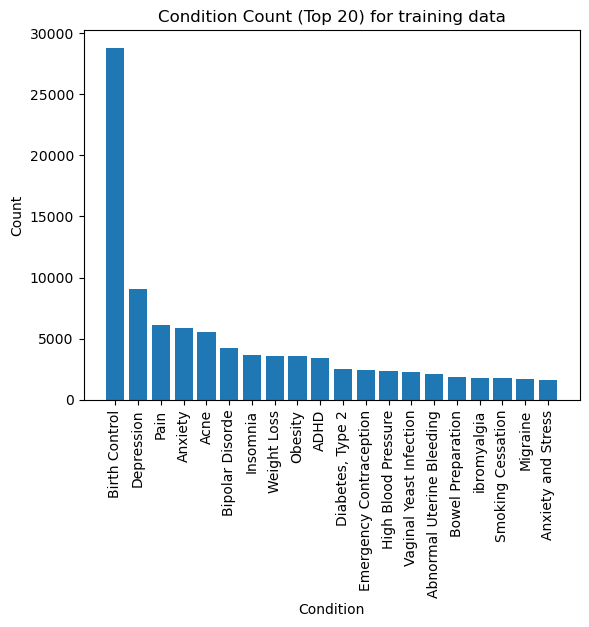

In [ ]:
condition = drug_train['condition']

# Count the occurrence of each condition value
condition_counts = drug_train.condition.value_counts()

# Get the top 20 conditions with the highest counts
top_20_conditions = condition_counts.head(20)

# Sort the conditions and their corresponding counts in descending order
sorted_conditions = top_20_conditions.index
sorted_counts = top_20_conditions.values

# Plotting the bar chart with ordered values
plt.bar(range(len(sorted_conditions)), sorted_counts)

# Set the x-axis tick positions and labels
plt.xticks(range(len(sorted_conditions)), sorted_conditions, rotation=90)

# Add labels and title
plt.xlabel('Condition')
plt.ylabel('Count')
plt.title('Condition Count (Top 20) for training data')

# Display the plot
plt.show()

In [ ]:
drug_test.condition.value_counts()

Birth Control                                                     9648
Depression                                                        3095
Pain                                                              2100
Anxiety                                                           1908
Acne                                                              1847
Bipolar Disorde                                                   1380
Weight Loss                                                       1248
Insomnia                                                          1231
Obesity                                                           1189
ADHD                                                              1126
Emergency Contraception                                            827
Vaginal Yeast Infection                                            811
Diabetes, Type 2                                                   808
High Blood Pressure                                                783
Smokin

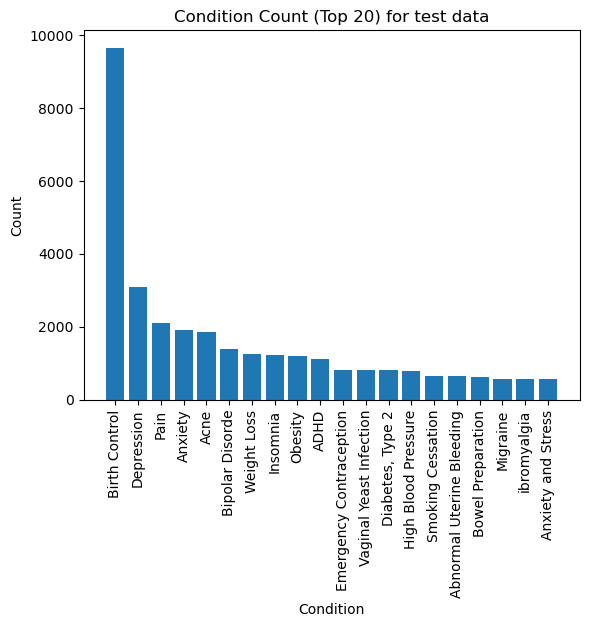

In [ ]:
condition = drug_test['condition']

# Count the occurrence of each condition value
condition_counts = drug_test.condition.value_counts()

# Get the top 20 conditions with the highest counts
top_20_conditions = condition_counts.head(20)

# Sort the conditions and their corresponding counts in descending order
sorted_conditions = top_20_conditions.index
sorted_counts = top_20_conditions.values

# Plotting the bar chart with ordered values
plt.bar(range(len(sorted_conditions)), sorted_counts)

# Set the x-axis tick positions and labels
plt.xticks(range(len(sorted_conditions)), sorted_conditions, rotation=90)

# Add labels and title
plt.xlabel('Condition')
plt.ylabel('Count')
plt.title('Condition Count (Top 20) for test data')

# Display the plot
plt.show()

In [ ]:
drug_train['usefulCount'].value_counts()

2       6391
3       6379
0       6318
4       6258
1       6148
5       5856
6       5432
7       5061
8       4701
9       4463
10      4164
11      3839
12      3696
13      3591
14      3270
15      3258
17      2941
16      2885
18      2647
19      2546
20      2544
21      2414
23      2369
22      2307
24      2143
25      1950
26      1935
27      1887
28      1776
29      1725
31      1591
30      1576
33      1512
32      1479
35      1413
34      1402
36      1292
37      1184
38      1176
39      1158
41      1152
40      1148
43      1048
42      1036
45       984
44       982
46       893
47       816
48       792
49       783
55       756
50       754
52       735
51       724
53       658
54       656
58       634
56       563
61       559
59       551
62       549
57       547
63       544
60       540
65       537
66       507
64       495
67       464
68       450
70       445
72       416
69       416
75       390
73       387
74       362
76       357
77       350

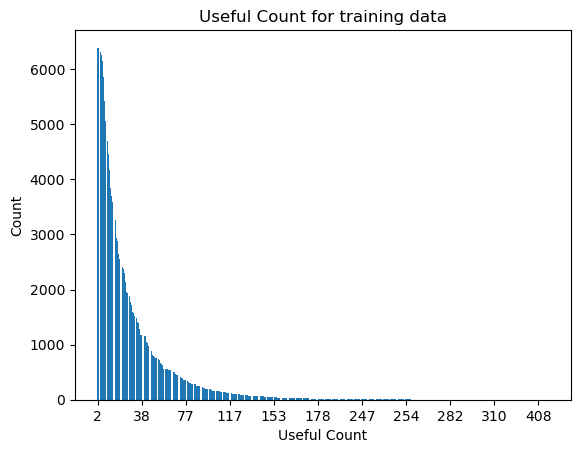

In [ ]:
usefulcounts = drug_train['usefulCount']

# Count the occurrence of each usefulcount value
usefulcount_counts = usefulcounts.value_counts()

# Plotting the bar chart with ordered values
plt.bar(range(len(usefulcount_counts)), usefulcount_counts)

# Set the x-axis tick positions and labels
n_labels = 10  # Number of labels to display
step = len(usefulcount_counts) // n_labels  # Calculate the step size
x_labels = usefulcount_counts.index[::step]  # Select labels based on the step size
plt.xticks(range(0, len(usefulcount_counts), step), x_labels)

# Add labels and title
plt.xlabel('Useful Count')
plt.ylabel('Count')
plt.title('Useful Count for training data')

# Display the plot
plt.show()

In [ ]:
drug_test['usefulCount'].value_counts()

2      2152
3      2146
1      2089
0      2084
4      2043
5      1988
6      1781
7      1675
8      1570
9      1477
10     1399
12     1314
11     1273
13     1186
14     1099
15     1040
16     1031
17      958
18      903
19      879
22      814
20      808
21      796
23      753
24      707
25      667
27      649
26      649
28      624
29      542
33      524
32      518
31      508
30      499
34      483
35      453
37      419
36      418
38      412
39      372
43      364
40      359
42      355
41      342
45      314
46      308
44      302
47      295
48      264
55      263
51      248
50      245
49      240
53      220
59      218
52      216
54      210
58      200
61      198
62      191
56      186
57      182
64      168
65      166
68      156
69      153
60      153
63      149
70      147
66      137
67      133
72      133
75      131
77      126
73      124
74      119
80      114
79      113
71      108
76      104
78      103
85       91
81       90
86  

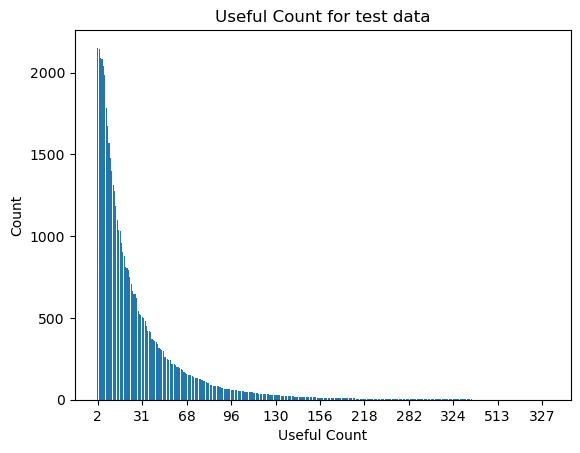

In [ ]:
usefulcounts = drug_test['usefulCount']

# Count the occurrence of each usefulcount value
usefulcount_counts = usefulcounts.value_counts()

# Plotting the bar chart with ordered values
plt.bar(range(len(usefulcount_counts)), usefulcount_counts)

# Set the x-axis tick positions and labels
n_labels = 10  # Number of labels to display
step = len(usefulcount_counts) // n_labels  # Calculate the step size
x_labels = usefulcount_counts.index[::step]  # Select labels based on the step size
plt.xticks(range(0, len(usefulcount_counts), step), x_labels)

# Add labels and title
plt.xlabel('Useful Count')
plt.ylabel('Count')
plt.title('Useful Count for test data')

# Display the plot
plt.show()

In [ ]:
drug_train_t = drug_train[(drug_train['condition']=='Birth Control') | (drug_train['condition']=='Depression') | (drug_train['condition']=='Pain')|(drug_train['condition']=='Anxiety ')| (drug_train['condition']=='Acne') | (drug_train['condition']=='Bipolar Disorde')|(drug_train['condition']=='Weight Loss')| (drug_train['condition']=='Insomnia')|(drug_train['condition']=='Obesity')|(drug_train['condition']=='ADHD')|(drug_train['condition']=='Emergency Contraception')|(drug_train['condition']=='Vaginal Yeast Infection')|(drug_train['condition']=='Diabetes, Type 2')|(drug_train['condition']=='High Blood Pressure')|(drug_train['condition']=='Smoking Cessation')|(drug_train['condition']=='Abnormal Uterine Bleeding ')|(drug_train['condition']=='Migraine ')|(drug_train['condition']=='Anxiety and Stress')|(drug_train['condition']=='Major Depressive Disorde')|(drug_train['condition']=='Panic Disorde')|(drug_train['condition']=='Constipation')|(drug_train['condition']=='Urinary Tract Infection')]






In [ ]:
drug_train.shape

(161297, 7)

In [ ]:
drug_test.shape

(53766, 7)

In [ ]:
drug_train_t.shape

(87083, 7)

In [ ]:
D = drug_train_t.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)

In [ ]:
D.condition.value_counts()

Birth Control               28788
Depression                   9069
Pain                         6145
Acne                         5588
Bipolar Disorde              4224
Insomnia                     3673
Weight Loss                  3609
Obesity                      3568
ADHD                         3383
Diabetes, Type 2             2554
Emergency Contraception      2463
High Blood Pressure          2321
Vaginal Yeast Infection      2274
Smoking Cessation            1780
Anxiety and Stress           1663
Major Depressive Disorde     1607
Constipation                 1595
Panic Disorde                1463
Urinary Tract Infection      1316
Name: condition, dtype: int64

In [ ]:
D.head()

,condition,review
1,ADHD,"""My son is halfway through his fourth week of ..."
2,Birth Control,"""I used to take another oral contraceptive, wh..."
3,Birth Control,"""This is my first time using any form of birth..."
6,Emergency Contraception,"""He pulled out, but he cummed a bit in me. I t..."
7,Bipolar Disorde,"""Abilify changed my life. There is hope. I was..."


In [ ]:
# segregating dataframe for analyzing individual condition
D_birth=D[(D['condition']=='Birth Control')]
D_dep=D[(D['condition']=='Depression')]
D_pai=D[(D['condition']=='Pain ')]
D_acn=D[(D['condition']=='Acne')]
D_bd=D[(D['condition']=='Bipolar Disorde')]
D_wl=D[(D['condition']=='Weight Loss')]
D_inso=D[(D['condition']=='Insomnia')]
D_obe=D[(D['condition']=='Obesity')]
D_adhd=D[(D['condition']=='ADHD')]
D_emrg=D[(D['condition']=='Emergency Contraception')]
D_VYI=D[(D['condition']=='Vaginal Yeast Infection ')]
D_dia=D[(D['condition']=='Diabetes, Type 2')]
D_hbp=D[(D['condition']=='High Blood Pressure ')]
D_sc=D[(D['condition']=='Smoking Cessation')]
D_as=D[(D['condition']=='Anxiety and Stress')]
D_pd=D[(D['condition']=='Panic Disorde')]
D_con=D[(D['condition']=='Constipation  ')]
D_UTI=D[(D['condition']=='Urinary Tract Infection ')]


In [ ]:
pip install wordcloud

Text(0.5, 1.0, 'Word cloud for Birth control')

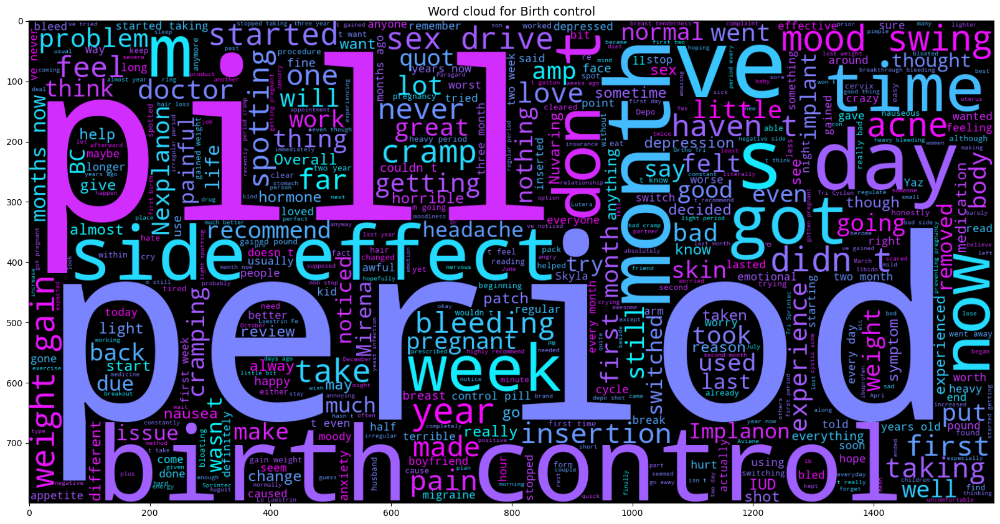

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='cool').generate(" ".join(D_birth.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Birth control',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

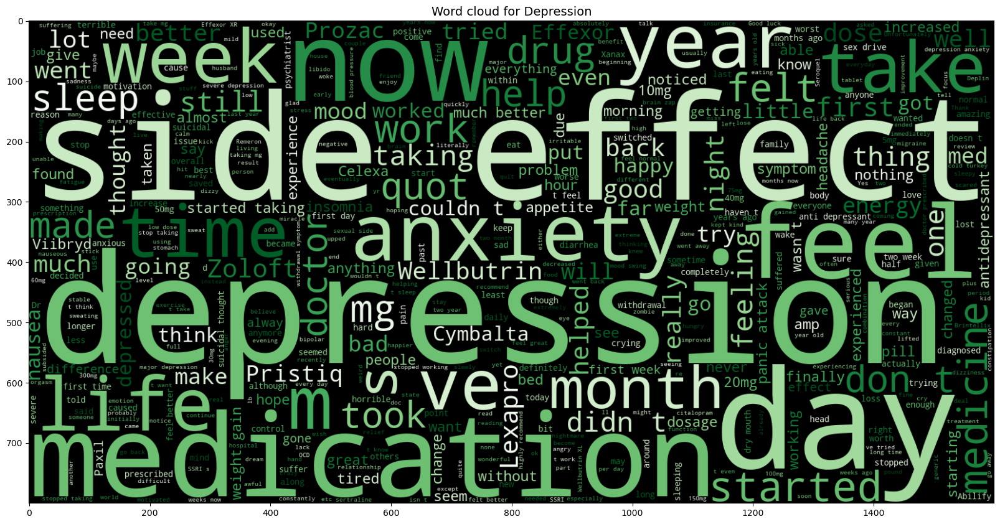

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='Greens').generate(" ".join(D_dep.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Depression',fontsize=14)

In [ ]:
# Check if the 'review' column exists and has non-null values
if 'review' not in D_VYI.columns or D_VYI['review'].isnull().all():
    print("No valid text data found.")
else:
    # Generate the word cloud
    wc = WordCloud(max_words=500, width=1600, height=800).generate(" ".join(D_pai.review))

    # Plotting the word cloud
    plt.figure(figsize=(20, 20))
    plt.imshow(wc, interpolation='bilinear')
    plt.title('Word Cloud for Pain', fontsize=14)

    # Display the plot
    plt.axis('off')
    plt.show()

No valid text data found.


Text(0.5, 1.0, 'Word cloud for acne')

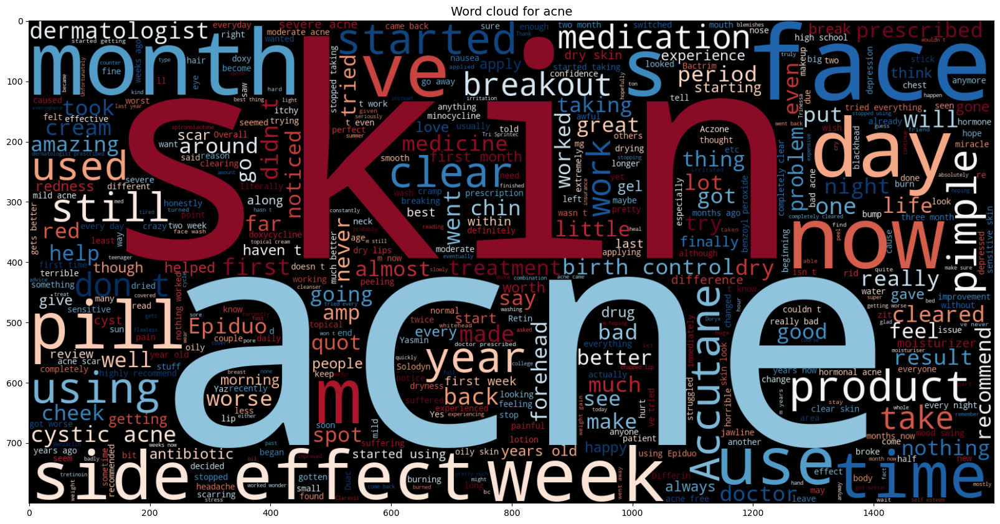

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='RdBu_r').generate(" ".join(D_acn.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for acne',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Bipolar Disorde')

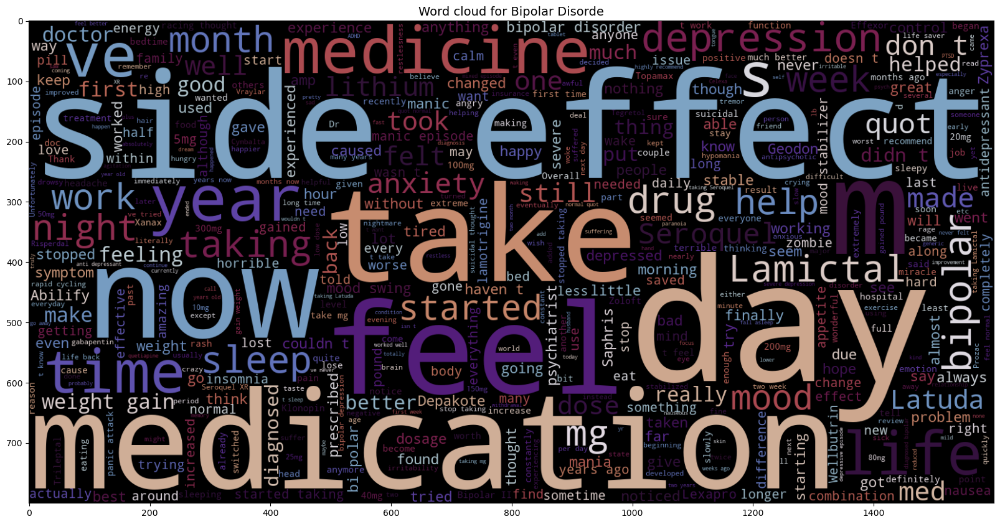

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='twilight_shifted_r').generate(" ".join(D_bd.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Bipolar Disorde',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Weight Loss')

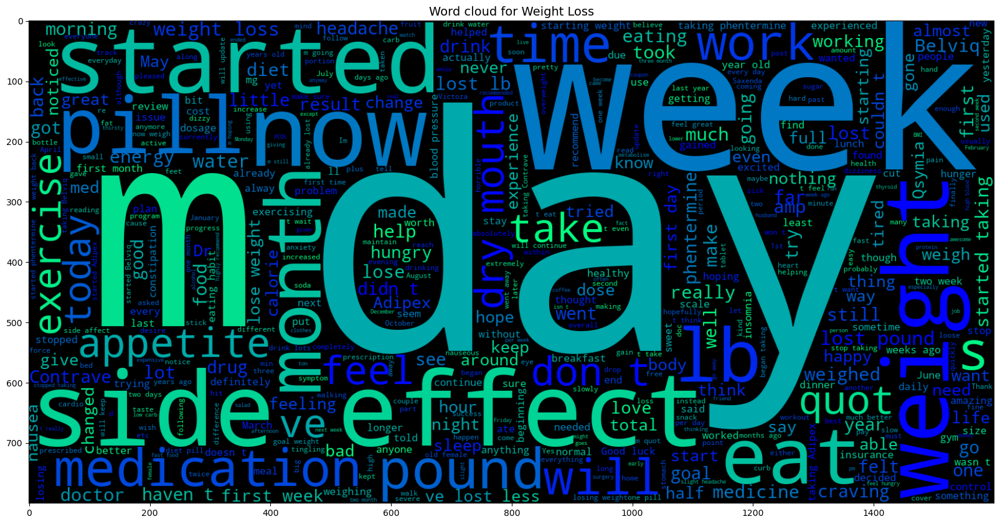

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='winter_r').generate(" ".join(D_wl.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Weight Loss',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Insomnia')

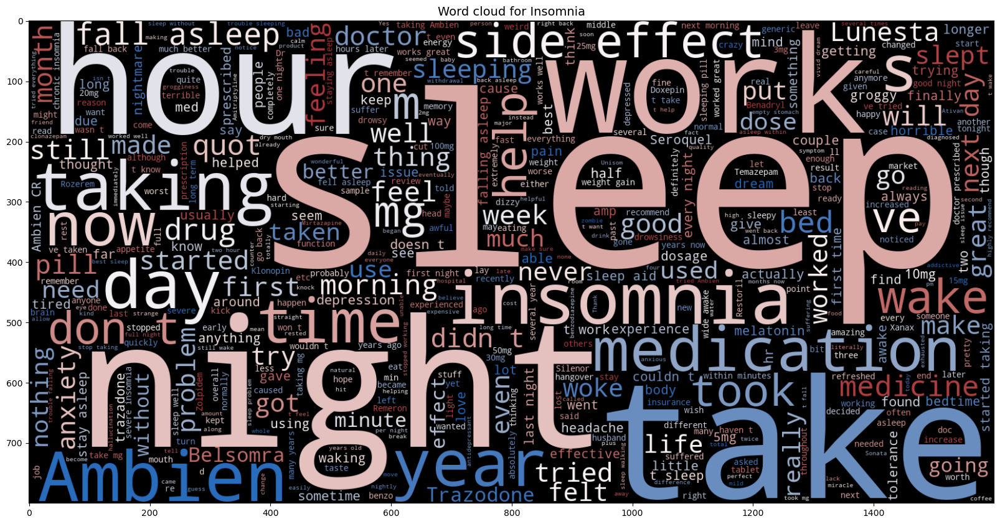

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='vlag_r').generate(" ".join(D_inso.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Insomnia',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Obesity')

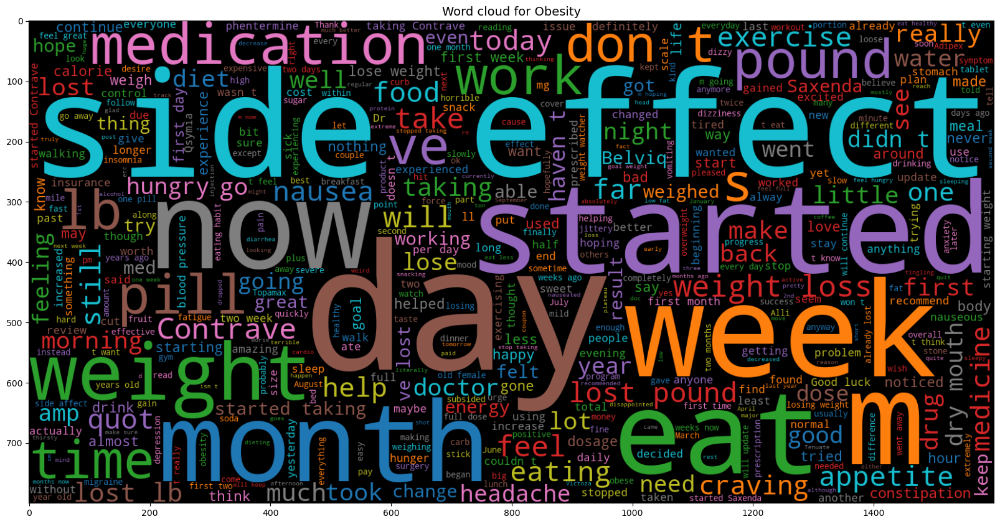

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='tab10').generate(" ".join(D_obe.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Obesity',fontsize=14)

Text(0.5, 1.0, 'Word cloud for ADHD')

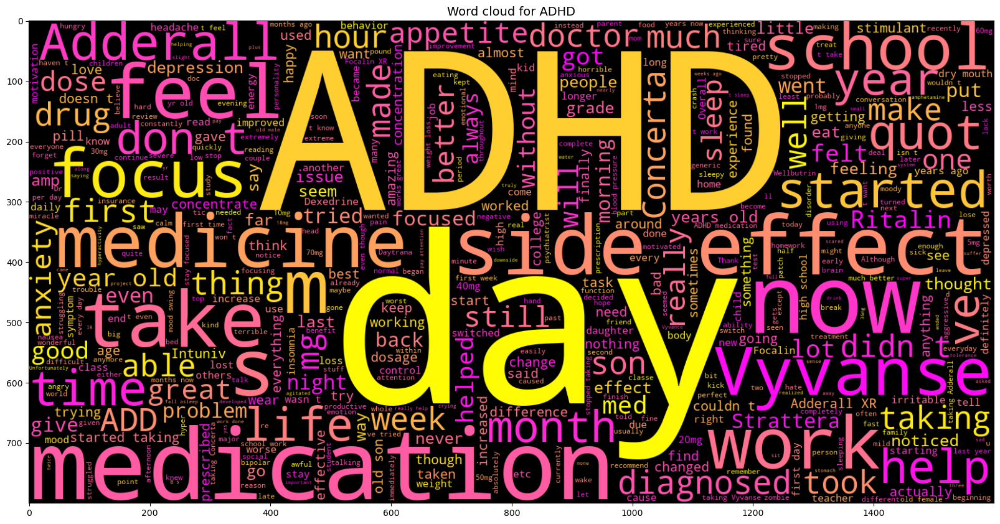

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='spring_r').generate(" ".join(D_adhd.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for ADHD',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Emergency Contraception')

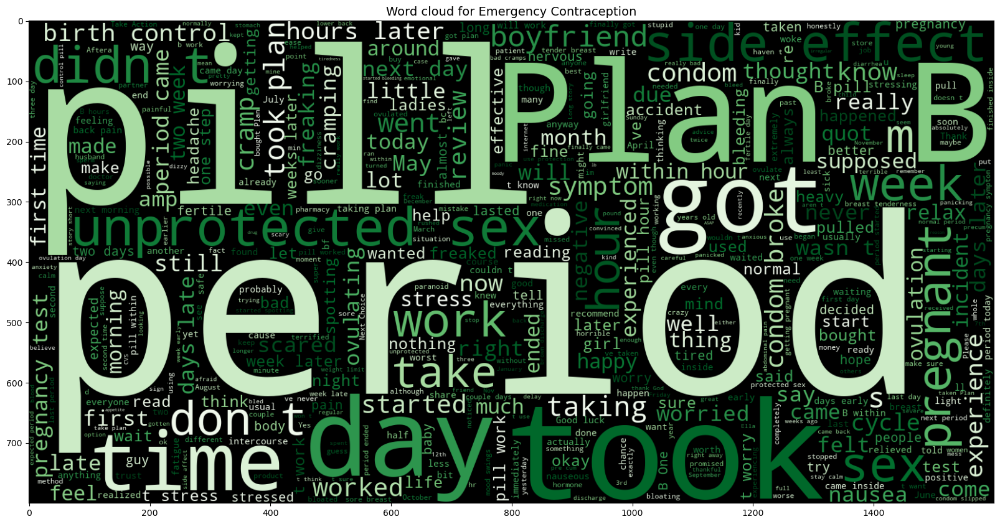

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='Greens').generate(" ".join(D_emrg.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Emergency Contraception',fontsize=14)

In [ ]:

# Check if the 'review' column exists and has non-null values
if 'review' not in D_VYI.columns or D_VYI['review'].isnull().all():
    print("No valid text data found.")
else:
    # Generate the word cloud
    wc = WordCloud(max_words=500, width=1600, height=800).generate(" ".join(D_VYI.review))

    # Plotting the word cloud
    plt.figure(figsize=(20, 20))
    plt.imshow(wc, interpolation='bilinear')
    plt.title('Word Cloud for Vaginal Yeast Infection', fontsize=14)

    # Display the plot
    plt.axis('off')
    plt.show()


No valid text data found.


Text(0.5, 1.0, 'Word cloud for Diabetes, Type 2')

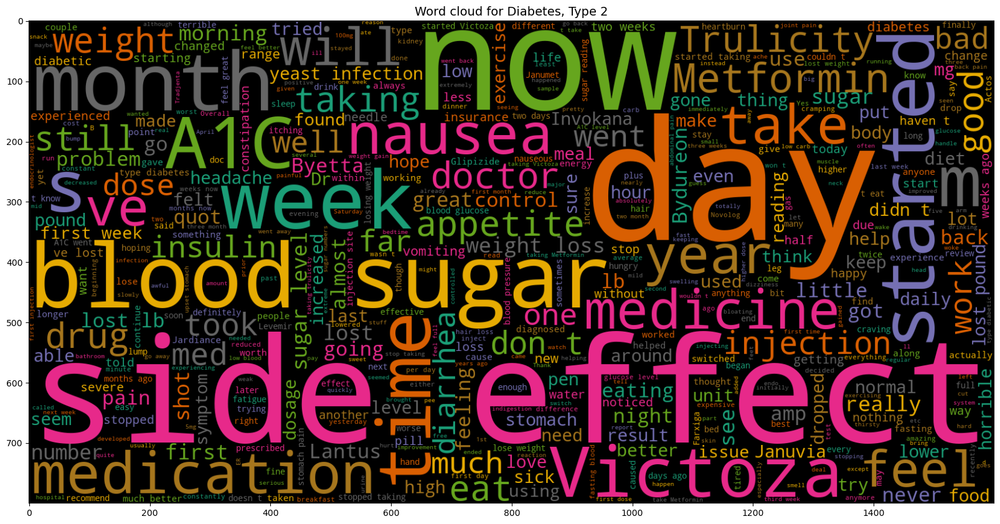

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='Dark2').generate(" ".join(D_dia.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Diabetes, Type 2',fontsize=14)

In [ ]:
# Check if the 'review' column exists and has non-null values
if 'review' not in D_VYI.columns or D_VYI['review'].isnull().all():
    print("No valid text data found.")
else:
    # Generate the word cloud
    wc = WordCloud(max_words=500, width=1600, height=800).generate(" ".join(D_hbp.review))

    # Plotting the word cloud
    plt.figure(figsize=(20, 20))
    plt.imshow(wc, interpolation='bilinear')
    plt.title('Word Cloud for High Blood Pressure', fontsize=14)

    # Display the plot
    plt.axis('off')
    plt.show()


No valid text data found.


Text(0.5, 1.0, 'Word cloud for Smoking Cessation')

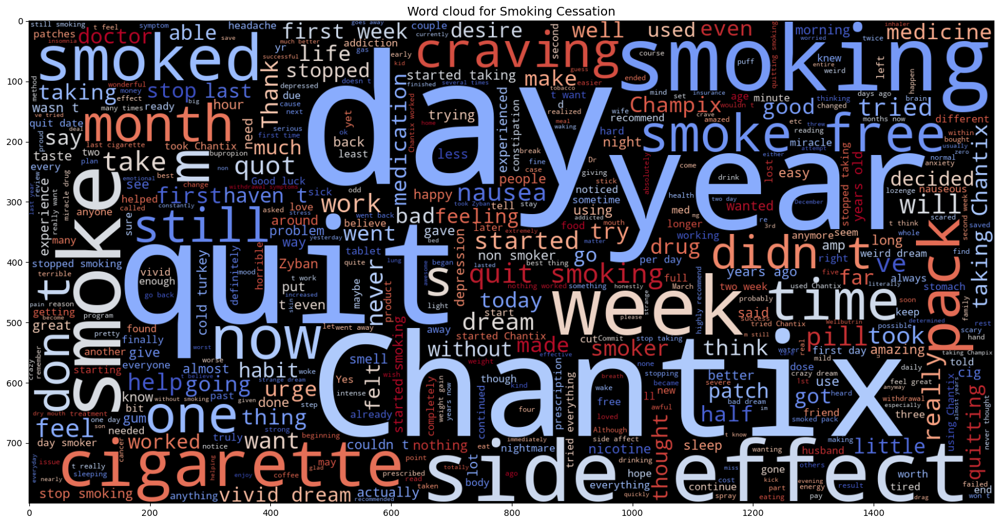

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='coolwarm').generate(" ".join(D_sc.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Smoking Cessation',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Anxiety and Stress')

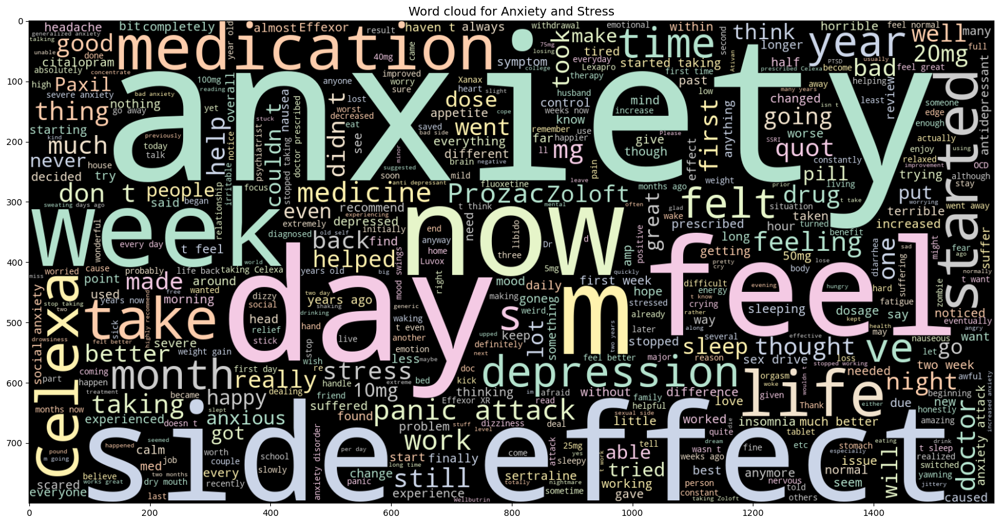

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='Pastel2_r').generate(" ".join(D_as.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Anxiety and Stress',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Panic Disorde')

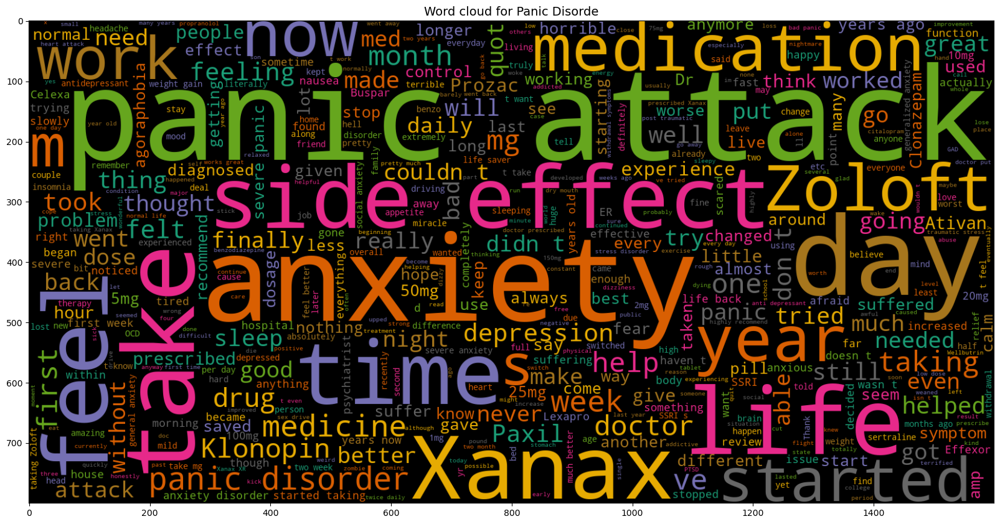

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800,colormap='Dark2').generate(" ".join(D_pd.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Panic Disorde',fontsize=14)

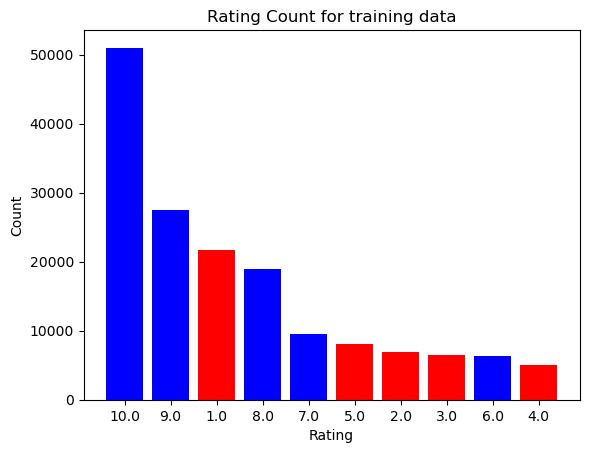

In [ ]:
rates = drug_train['rating']

# Count the occurrence of each rate value
rate_counts = rates.value_counts()

# Sort the rate_counts in descending order
rate_counts = rate_counts.sort_values(ascending=False)

# Get the sorted rate values and their corresponding counts
sorted_rates = rate_counts.index
sorted_counts = rate_counts.values

# Plotting the bar chart with ordered values and different colors
plt.bar(range(len(sorted_rates)), sorted_counts, color=['blue' if rate > 5 else 'red' for rate in sorted_rates])

# Set the x-axis tick positions and labels
plt.xticks(range(len(sorted_rates)), sorted_rates)

# Add labels and title
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Rating Count for training data')

# Display the plot
plt.show()

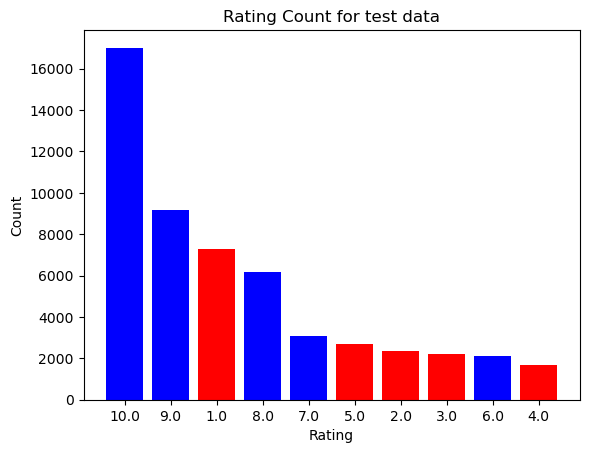

In [ ]:
rates = drug_test['rating']

# Count the occurrence of each rate value
rate_counts = rates.value_counts()

# Sort the rate_counts in descending order
rate_counts = rate_counts.sort_values(ascending=False)

# Get the sorted rate values and their corresponding counts
sorted_rates = rate_counts.index
sorted_counts = rate_counts.values

# Plotting the bar chart with ordered values and different colors
plt.bar(range(len(sorted_rates)), sorted_counts, color=['blue' if rate > 5 else 'red' for rate in sorted_rates])

# Set the x-axis tick positions and labels
plt.xticks(range(len(sorted_rates)), sorted_rates)

# Add labels and title
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Rating Count for test data')

# Display the plot
plt.show()

# DATA PREPROCESSING

In [ ]:
drug_train = drug_train.drop(['Unnamed: 0','date'],axis=1)
drug_test = drug_test.drop(['Unnamed: 0','date'],axis=1)

In [ ]:
drug_train.head()

,drugName,condition,review,rating,usefulCount
0,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,27
1,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,192
2,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,17
3,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,10
4,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,37


In [ ]:
drug_test.head()

,drugName,condition,review,rating,usefulCount
0,Mirtazapine,Depression,"""I&#039;ve tried a few antidepressants over th...",10.0,22
1,Mesalamine,"Crohn's Disease, Maintenance","""My son has Crohn&#039;s disease and has done ...",8.0,17
2,Bactrim,Urinary Tract Infection,"""Quick reduction of symptoms""",9.0,3
3,Contrave,Weight Loss,"""Contrave combines drugs that were used for al...",9.0,35
4,Cyclafem 1 / 35,Birth Control,"""I have been on this birth control for one cyc...",9.0,4


### Step 1: tokenization

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Begena\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
def tokenize(df, column_name):

    df[column_name + '_tokens'] = df[column_name].apply(lambda text: word_tokenize(text))

    return df[column_name + '_tokens']

In [ ]:
tokenized_train_reviews = tokenize(drug_train, 'review')
tokenized_train_reviews.head()

0    [``, It, has, no, side, effect, ,, I, take, it...
1    [``, My, son, is, halfway, through, his, fourt...
2    [``, I, used, to, take, another, oral, contrac...
3    [``, This, is, my, first, time, using, any, fo...
4    [``, Suboxone, has, completely, turned, my, li...
Name: review_tokens, dtype: object

In [ ]:
tokenized_test_reviews = tokenize(drug_test, 'review')
tokenized_test_reviews.head()

0    [``, I, &, #, 039, ;, ve, tried, a, few, antid...
1    [``, My, son, has, Crohn, &, #, 039, ;, s, dis...
2             [``, Quick, reduction, of, symptoms, '']
3    [``, Contrave, combines, drugs, that, were, us...
4    [``, I, have, been, on, this, birth, control, ...
Name: review_tokens, dtype: object

### Step 2: remove stopwords

In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
stop_words

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Begena\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [ ]:
def remove_stopwords(tokenized_text):

    filtered_text = [word for word in tokenized_text if word.lower() not in stop_words]

    return filtered_text

In [ ]:
filtered_train_reviews = tokenized_train_reviews.apply(remove_stopwords)
filtered_train_reviews.head()

0    [``, side, effect, ,, take, combination, Bysto...
1    [``, son, halfway, fourth, week, Intuniv, ., b...
2    [``, used, take, another, oral, contraceptive,...
3    [``, first, time, using, form, birth, control,...
4    [``, Suboxone, completely, turned, life, aroun...
Name: review_tokens, dtype: object

In [ ]:
filtered_test_reviews = tokenized_test_reviews.apply(remove_stopwords)
filtered_test_reviews.head()

0    [``, &, #, 039, ;, tried, antidepressants, yea...
1    [``, son, Crohn, &, #, 039, ;, disease, done, ...
2                 [``, Quick, reduction, symptoms, '']
3    [``, Contrave, combines, drugs, used, alcohol,...
4    [``, birth, control, one, cycle, ., reading, r...
Name: review_tokens, dtype: object

### Step 3: lemmatization

In [ ]:
# pip install spacy

In [ ]:
import spacy
spacy.cli.download('en_core_web_sm')
nlp = spacy.load("en_core_web_sm")

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [ ]:
def apply_lemmatization(filtered_text):

    lemmatized_text = [token.lemma_ for token in nlp(" ".join(filtered_text))]

    return lemmatized_text

In [ ]:
lemmatized_train_reviews = filtered_train_reviews.apply(apply_lemmatization)
lemmatized_train_reviews.head()

0    [`, `, side, effect, ,, take, combination, Bys...
1    [`, `, son, halfway, fourth, week, Intuniv, .,...
2    [`, `, use, take, another, oral, contraceptive...
3    [`, `, first, time, use, form, birth, control,...
4    [`, `, Suboxone, completely, turn, life, aroun...
Name: review_tokens, dtype: object

In [ ]:
lemmatized_test_reviews = filtered_test_reviews.apply(apply_lemmatization)
lemmatized_test_reviews.head()

0    [`, `, &, #, 039, ;, try, antidepressant, year...
1    [`, `, son, Crohn, &, #, 039, ;, disease, do, ...
2                [`, `, quick, reduction, symptom, '']
3    [`, `, contrave, combine, drug, use, alcohol, ...
4    [`, `, birth, control, one, cycle, ., read, re...
Name: review_tokens, dtype: object

In [ ]:
drug_train['lemmatized_review'] = lemmatized_train_reviews
drug_test['lemmatized_review'] = lemmatized_test_reviews

### Step 4: removing zero-length

In [ ]:
drug_train = drug_train[drug_train['lemmatized_review'].apply(len) > 0]
drug_test = drug_test[drug_test['lemmatized_review'].apply(len) > 0]

In [ ]:
drug_train.shape

(161297, 7)

In [ ]:
drug_test.shape

(53766, 7)

### Step 5: word embedding

In [ ]:
from collections import Counter


In [ ]:
def encode_words(data):
    words = []
    for i in data:
        words.extend(i)
    counts = Counter(words)
    vocab = sorted(counts, key=counts.get, reverse=True)
    vocab_to_int = {word: i for i, word in enumerate(vocab, 1)}
    return vocab_to_int

In [ ]:
lemmatized_train_reviews_list = lemmatized_train_reviews.tolist()
lemmatized_test_reviews_list = lemmatized_test_reviews.tolist()

In [ ]:
lemmatized_test_reviews_list

[['`',
  '`',
  '&',
  '#',
  '039',
  ';',
  'try',
  'antidepressant',
  'year',
  '(',
  'citalopram',
  ',',
  'fluoxetine',
  ',',
  'amitriptyline',
  ')',
  ',',
  'none',
  'help',
  'depression',
  ',',
  'insomnia',
  '&',
  'amp',
  ';',
  'anxiety',
  '.',
  'doctor',
  'suggest',
  'change',
  'onto',
  '45',
  'mg',
  'mirtazapine',
  'medicine',
  'save',
  'life',
  '.',
  'thankfully',
  'side',
  'effect',
  'especially',
  'common',
  '-',
  'weight',
  'gain',
  ',',
  '&',
  '#',
  '039',
  ';',
  'actually',
  'lose',
  'alot',
  'weight',
  '.',
  'still',
  'suicidal',
  'thought',
  'mirtazapine',
  'save',
  '.',
  "''"],
 ['`',
  '`',
  'son',
  'Crohn',
  '&',
  '#',
  '039',
  ';',
  'disease',
  'do',
  'well',
  'Asacol',
  '.',
  'complaint',
  'show',
  'side',
  'effect',
  '.',
  'take',
  'many',
  'nine',
  'tablet',
  'per',
  'day',
  'one',
  'time',
  '.',
  '&',
  '#',
  '039',
  ';',
  'happy',
  'result',
  ',',
  'reduce',
  'bout',
  'diarr

In [ ]:
encoded_voc = encode_words(lemmatized_train_reviews_list + lemmatized_test_reviews_list)

In [ ]:
encoded_voc

{'anxiey': 1,
 'forceps': 2,
 'vulva': 3,
 'BCI': 4,
 'mirt': 5,
 '95/100': 6,
 'Vyvanze': 7,
 'rose': 8,
 '1,800mg': 9,
 'ramification': 10,
 'dispaire': 11,
 'dumbbell': 12,
 'Popeye': 13,
 'Dithranol': 14,
 'READ': 15,
 'cascara': 16,
 'Solution': 17,
 'Roacutan': 18,
 '50MG': 19,
 'campo': 20,
 'defray': 21,
 'syncopal': 22,
 'Azathiaporine': 23,
 'goalie': 24,
 'santanic': 25,
 'NORMAL': 26,
 'ophthalmic': 27,
 'appropriate': 28,
 'antibodies': 29,
 'NovaSure': 30,
 'methylpredisone': 31,
 'Retrograde': 32,
 'CBDs': 33,
 'grudgingly': 34,
 'Mayer': 35,
 'ando': 36,
 'insincere': 37,
 'Orrin': 38,
 'today-9/23/15': 39,
 'cyclafem': 40,
 'movie': 41,
 '450': 42,
 'leader': 43,
 'neurotransmiter': 44,
 'Benonatate': 45,
 'unforgive': 46,
 'psychologicaly': 47,
 'SPOT': 48,
 'conplaint': 49,
 'cognition': 50,
 'WEAKNESS': 51,
 'redboxes': 52,
 'mastiff': 53,
 'seeked': 54,
 'formal': 55,
 'Portsmouth': 56,
 'bucked': 57,
 'allergies/': 58,
 'MOISTURIZER': 59,
 'imy': 60,
 '11/16': 61,

In [ ]:
len(encoded_voc)

68627

In [ ]:
def encode_data(list_of_lists, vocab_mapping):
    reviews_ints = []
    for review in list_of_lists:
        review_ints = [vocab_mapping.get(word, 0) for word in review]
        reviews_ints.append(review_ints)
    return reviews_ints

In [ ]:
encoded_train_reviews = encode_data(lemmatized_train_reviews_list,encoded_voc)
encoded_test_reviews = encode_data(lemmatized_test_reviews_list,encoded_voc)

In [ ]:
type(encoded_train_reviews[3])

list

In [ ]:
encoded_train_reviews[55]

[41252,
 41252,
 2396,
 36639,
 24723,
 22092,
 16447,
 14521,
 12180,
 32481,
 59243,
 5890,
 59243,
 20425,
 49521,
 59243,
 7806,
 22092,
 52468,
 42132,
 27223,
 59243,
 39213,
 23675,
 53760,
 22092,
 49858,
 18619,
 944,
 6002,
 32362,
 63414,
 53142,
 18619,
 30799,
 32362,
 44409,
 55613,
 18619,
 30799,
 32362,
 10718,
 18619,
 944,
 6002,
 32362,
 37748,
 32272,
 15353,
 3290,
 22092,
 63414,
 37102,
 55095,
 24031,
 59243,
 48737,
 66037,
 43304,
 24031,
 22092,
 24439,
 59749,
 32422,
 30431,
 52727,
 39213,
 53516,
 59243,
 67324,
 57657,
 59506,
 59243,
 18619,
 944,
 6002,
 32362,
 18619,
 30799,
 32362,
 39885,
 27207,
 18619,
 30799,
 32362,
 59243,
 66033,
 31498,
 13303,
 47439,
 22092,
 67206,
 39714,
 63262,
 22092,
 63414,
 59190,
 13915,
 68255,
 16605,
 41883,
 19353,
 22092,
 63414,
 29749,
 26194,
 14742,
 42110,
 60557,
 39213,
 26391,
 22092,
 60557,
 45033,
 57657,
 38246,
 22092,
 63414,
 13893,
 60089,
 25037,
 17769,
 52954,
 5890,
 59243,
 58010,
 5261,

In [ ]:
encoded_train_reviews[3]

[41252,
 41252,
 54921,
 52285,
 49798,
 4711,
 67374,
 44476,
 22092,
 18619,
 944,
 6002,
 32362,
 53866,
 31088,
 61846,
 59243,
 51966,
 1371,
 22092,
 54921,
 3290,
 34205,
 22321,
 22092,
 57976,
 55060,
 17769,
 56141,
 35520,
 20356,
 50619,
 2759,
 7186,
 59806,
 13506,
 49798,
 17769,
 52344,
 50619,
 64052,
 7186,
 43060,
 67039,
 55060,
 8812,
 15537,
 54921,
 49661,
 7186,
 17769,
 59243,
 23002,
 8812,
 49798,
 67374,
 44476,
 22092,
 45033,
 61846,
 48138]

### Step 6: padding

In [ ]:
#pip install tensorflow

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
enconded_train_review_lens = Counter([len(x) for x in encoded_train_reviews])
enconded_test_review_lens = Counter([len(x) for x in encoded_test_reviews])

In [ ]:
max(enconded_train_review_lens)

1413

In [ ]:
max(enconded_test_review_lens)

748

In [ ]:
train_feature = pad_sequences(encoded_train_reviews, maxlen=max(enconded_train_review_lens))
test_feature = pad_sequences(encoded_test_reviews, maxlen=max(enconded_train_review_lens))

In [ ]:
test_feature

array([[    0,     0,     0, ..., 35762, 22092, 48138],
       [    0,     0,     0, ..., 53102, 22092, 48138],
       [    0,     0,     0, ..., 52641, 55411, 48138],
       ...,
       [    0,     0,     0, ..., 50994, 22092, 48138],
       [    0,     0,     0, ..., 53421, 22092, 48138],
       [    0,     0,     0, ..., 15179, 15179, 48138]])

In [ ]:
drug_train['feature'] = np.array(train_feature).tolist()
drug_test['feature'] = np.array(test_feature).tolist()

In [ ]:
drug_test['feature'][0][-1:-5:-1]

[48138, 22092, 35762, 62422]

# Defining sentiment classes and target

In [ ]:
def categorize_sentiment(value):
    if value in [1, 2, 3]:
        return 0
    elif value in [4, 5]:
        return 1
    elif value in [6, 7]:
        return 2
    else:
        return 3

In [ ]:
drug_train['sentiment'] = drug_train['rating'].apply(categorize_sentiment)
drug_test['sentiment'] = drug_test['rating'].apply(categorize_sentiment)

# Test samples and split

In [ ]:
drug_train_sample = drug_train.sample(n=10000, random_state=0)
drug_test_sample = drug_test.sample(n=5000, random_state=0)

In [ ]:
drug_train_sample.head()

,drugName,condition,review,rating,usefulCount,review_tokens,lemmatized_review,sentiment,feature
137738,Nubain,Pain,"""I recently received an injection of nalbuphin...",9.0,12,"[``, I, recently, received, an, injection, of,...","[`, `, recently, receive, injection, nalbuphin...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
125778,Hydromorphone,Pain,"""I went to the emergency room in the worst pai...",10.0,1,"[``, I, went, to, the, emergency, room, in, th...","[`, `, go, emergency, room, bad, pain, life, ....",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
26647,Nexplanon,Birth Control,"""HORRIBLE! I was not myself at all. I cried ev...",1.0,7,"[``, HORRIBLE, !, I, was, not, myself, at, all...","[`, `, HORRIBLE, !, ., cry, everyday, ,, sever...",0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
89592,Docosanol,Herpes Simplex,"""I use this medication daily and by doing this...",10.0,1,"[``, I, use, this, medication, daily, and, by,...","[`, `, use, medication, daily, find, drastical...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
83605,Primidone,Benign Essential Trem,"""Tremors seem to be getting worse. I take 2 a ...",3.0,10,"[``, Tremors, seem, to, be, getting, worse, .,...","[`, `, tremor, seem, get, bad, ., take, 2, day...",0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
drug_test_sample.head()

,drugName,condition,review,rating,usefulCount,review_tokens,lemmatized_review,sentiment,feature
50287,Generess Fe,Birth Control,"""Was on various birth control pills, last one ...",9.0,27,"[``, Was, on, various, birth, control, pills, ...","[`, `, various, birth, control, pill, ,, last,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
43081,Zomig,Migraine,"""I have suffered with migraines for over 40 ye...",10.0,6,"[``, I, have, suffered, with, migraines, for, ...","[`, `, suffer, migraine, 40, year, ., even, go...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
15753,Ethinyl estradiol / norethindrone,NaN,"""This is the 1st BC pill I&#039;ve ever taken....",6.0,2,"[``, This, is, the, 1st, BC, pill, I, &, #, 03...","[`, `, 1st, BC, pill, &, #, 039, ;, ever, take...",2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
23595,Lurasidone,Bipolar Disorde,"""Latuda has changed my life. I&#039;ve been t...",10.0,178,"[``, Latuda, has, changed, my, life, ., I, &, ...","[`, `, Latuda, change, life, ., &, #, 039, ;, ...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
24767,Ethinyl estradiol / norethindrone,Menstrual Disorders,"""I got my tubes tied about 8 months ago and it...",9.0,14,"[``, I, got, my, tubes, tied, about, 8, months...","[`, `, get, tube, tie, 8, month, ago, ruin, .,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
drug_train_sample.shape

(10000, 9)

In [ ]:
drug_test_sample.shape

(5000, 9)

In [ ]:
X_train,X_val,y_train,y_val = train_test_split(drug_train['feature'],drug_train['sentiment'],test_size = 0.2,random_state=0)

X_test,y_test = drug_test['feature'], drug_test['sentiment']

In [ ]:
type(X_train)

pandas.core.series.Series

# LSTM

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout

In [ ]:
# hyperparameters
embedding_dim = 100
max_sequence_length = max(enconded_train_review_lens)
vocab_size = len(encoded_voc) + 1
dropout_rate = 0.2
batch_size = 500

In [ ]:
# building the model
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length))
model.add(LSTM(units=embedding_dim))
model.add(Dropout(dropout_rate))
model.add(Dense(units=4, activation='softmax'))

In [ ]:
# compiling model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
# train the model
history = model.fit(np.array(X_train.values.tolist()), np.array(y_train.values.tolist()), batch_size=batch_size, epochs=10, validation_data=(np.array(X_val.values.tolist()), np.array(y_val.values.tolist())))

Epoch 1/10
259/259 [==============================] - 7581s 29s/step - loss: 0.8978 - accuracy: 0.6733 - val_loss: 0.7705 - val_accuracy: 0.7212
Epoch 2/10
259/259 [==============================] - 7920s 31s/step - loss: 0.7203 - accuracy: 0.7348 - val_loss: 0.7410 - val_accuracy: 0.7293
Epoch 3/10
259/259 [==============================] - 8154s 31s/step - loss: 0.6446 - accuracy: 0.7603 - val_loss: 0.7202 - val_accuracy: 0.7382
Epoch 4/10
259/259 [==============================] - 8379s 32s/step - loss: 0.5780 - accuracy: 0.7845 - val_loss: 0.7360 - val_accuracy: 0.7419
Epoch 5/10
259/259 [==============================] - 8549s 33s/step - loss: 0.5117 - accuracy: 0.8114 - val_loss: 0.7429 - val_accuracy: 0.7476
Epoch 6/10
259/259 [==============================] - 8692s 34s/step - loss: 0.4504 - accuracy: 0.8361 - val_loss: 0.7521 - val_accuracy: 0.7513
Epoch 7/10
259/259 [==============================] - 8779s 34s/step - loss: 0.3979 - accuracy: 0.8568 - val_loss: 0.7716 - val_ac

In [ ]:
# test model
test_loss, test_accuracy = model.evaluate(np.array(X_test.values.tolist()), np.array(y_test.values.tolist()))
print("Test Accuracy:", test_accuracy)

1681/1681 [==============================] - 1693s 1s/step - loss: 0.9768 - accuracy: 0.7556
Test Accuracy: 0.7556262612342834
